In [1]:
!pip install geodatasets
!pip install geopandas

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import geopandas
from geodatasets import get_path
from shapely.geometry import LineString

In [ ]:
!git clone https://github.com/JnKamas/projekt_siete.git

In [ ]:
edges = pd.read_csv("projekt_siete/openflights.txt", sep=" ",header = None, names = ['source','target','weight'])

In [ ]:
df = pd.read_csv("projekt_siete/openflights_airports.txt", sep=" ")
df.head()

<ipython-input-7-5d85ad3a9a31>:8: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  gdf_edges['geometry'] = gdf_edges.apply(lambda row: LineString([(gdf.loc[row['source'], 'geometry'].x, gdf.loc[row['source'], 'geometry'].y),


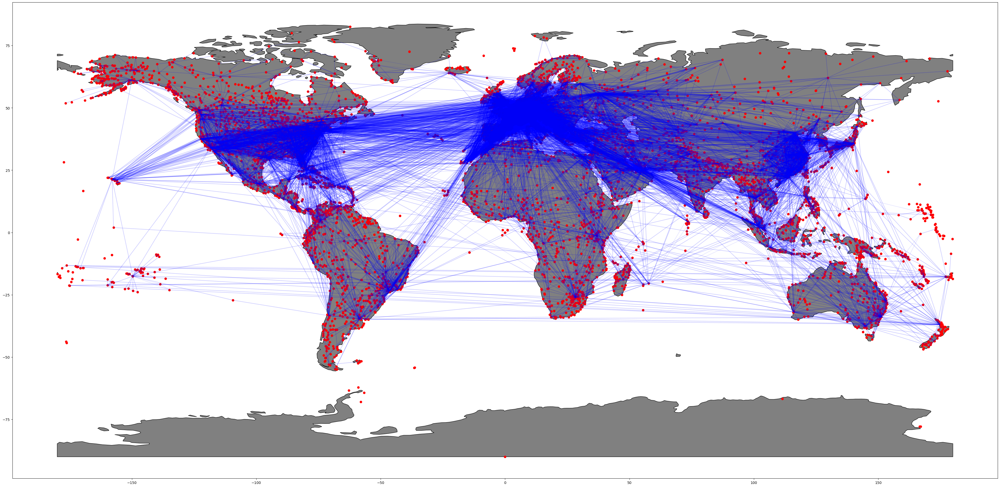

In [7]:
def create_map(edges):
  gdf = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude), crs="EPSG:4326")
  world = geopandas.read_file(get_path("naturalearth.land"))

  #edges
  gdf_edges = geopandas.GeoDataFrame(edges)
  gdf = gdf.set_index('Airport ID')
  gdf_edges['geometry'] = gdf_edges.apply(lambda row: LineString([(gdf.loc[row['source'], 'geometry'].x, gdf.loc[row['source'], 'geometry'].y),
                                                                (gdf.loc[row['target'], 'geometry'].x, gdf.loc[row['target'], 'geometry'].y)]),
                                        axis=1)
  gdf = gdf.reset_index()
  gdf_edges.crs = gdf.crs

  ax = world.plot(color="grey", edgecolor="black", figsize = (50,500))

  gdf_edges.plot(ax = ax, color = 'blue', alpha = 0.1)
  gdf.plot(ax=ax, color="red")

  plt.show()

  return gdf

gdf = create_map(edges)

**Základné štatistiky**
ako rozdelenie stupňa vrchola, hustota hrán centralita, blízkosť

*   rozdelenie stupňa vrchola
*   hustota hrán
*   blízkosť



In [36]:
def create_G(edges,weight = False):
  G = nx.from_pandas_edgelist(edges, 'source', 'target',create_using = nx.DiGraph())
  if(weight):
    G = nx.from_pandas_edgelist(edges, 'source', 'target',['weight'],create_using = nx.DiGraph())
  verticesNotIncludedInEdgeList = np.setdiff1d( df['Airport ID'], np.union1d(edges['source'],edges['target']))
  G.add_nodes_from(verticesNotIncludedInEdgeList)
  return G

G = create_G(edges,True)

In [25]:
# Adjacency matrix nie je symeytricka
adj_mat = nx.adjacency_matrix(G)
(adj_mat.T != adj_mat).sum()

2630

In [26]:
def degrees(gdf, G):
  gdf = gdf.sort_values(by = 'Airport ID')
  gdf['in_degree'] = list(dict(sorted(dict(G.in_degree()).items())).values())
  gdf['out_degree'] = list(dict(sorted(dict(G.out_degree()).items())).values())
  gdf['degree'] = gdf['out_degree'] + gdf['in_degree']

  return gdf

gdf = degrees(gdf,G)

Text(0.5, 0.98, 'Degree distribution for all vertices')

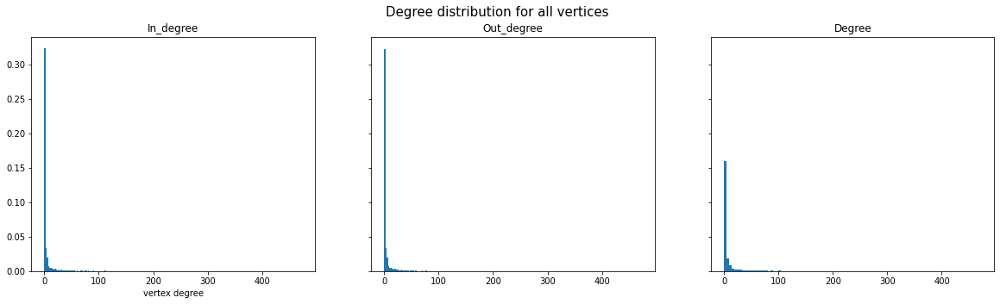

In [ ]:
fig,ax = plt.subplots(1,3,figsize = (20,5), sharex = True, sharey = True)
graph_in = ax[0].hist(gdf['in_degree'] , 100, density = 1)
graph_out = ax[1].hist(gdf['out_degree'] , 100, density = 1)
graph = ax[2].hist(gdf['degree'] , 100, density = 1)

ax[0].set_title('In_degree')
ax[1].set_title('Out_degree')
ax[2].set_title('Degree')

ax[0].set_xlabel('vertex degree')
fig.suptitle('Degree distribution for all vertices',fontsize = 15)

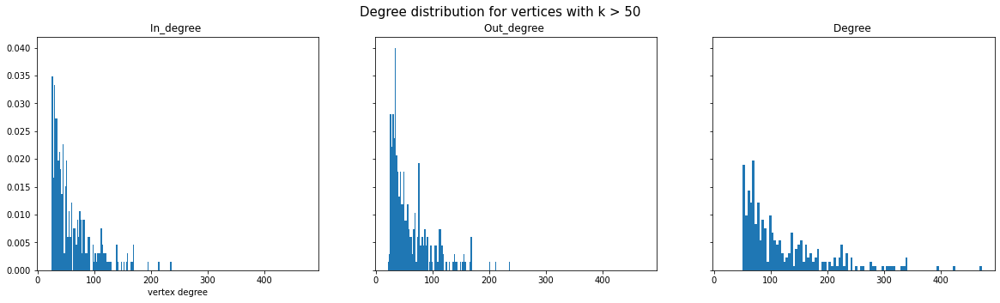

In [ ]:
fig,ax = plt.subplots(1,3,figsize = (20,5), sharex = True, sharey = True)
high_degrees = gdf[gdf['degree'] > 50]
graph_in = ax[0].hist(high_degrees['in_degree'] , 100, density = 1)
graph_out = ax[1].hist(high_degrees['out_degree'] , 100, density = 1)
graph = ax[2].hist(high_degrees['degree'] , 100, density = 1)

ax[0].set_title('In_degree ')
ax[1].set_title('Out_degree ')
ax[2].set_title('Degree ')

ax[0].set_xlabel('vertex degree')
fig.suptitle('Degree distribution for vertices with k > 50',fontsize = 15)
plt.show()

In [45]:
# 5 vertices with highest degree
gdf.sort_values(by = 'degree', ascending = False).head()

,Airport ID,Name,City,Country,IATA/FAA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,geometry,in_degree,out_degree,degree
337,340,Frankfurt Main,Frankfurt,Germany,FRA,EDDF,50.026421,8.543125,364,1.0,E,POINT (8.54312 50.02642),236,237,473
1358,1382,Charles De Gaulle,Paris,France,CDG,LFPG,49.012779,2.550000,392,1.0,E,POINT (2.55000 49.01278),213,213,426
575,580,Schiphol,Amsterdam,Netherlands,AMS,EHAM,52.308613,4.763889,-11,1.0,E,POINT (4.76389 52.30861),194,201,395
3268,3364,Capital Intl,Beijing,China,PEK,ZBAA,40.080111,116.584556,116,8.0,U,POINT (116.58456 40.08011),170,170,340
498,502,Gatwick,London,United Kingdom,LGW,EGKK,51.148056,-0.190278,202,0.0,E,POINT (-0.19028 51.14806),169,170,339


**Betweenes centrality**

Ktoré letiská sú najvyťaženejšie (v zmysle prestupov)?

**Closeness centrality**

Ktoré letiská sú najvýhodnejšie v zmysle, že sa viem od tiaľ dostať do veľa miest s málo prestupmi?

In [45]:
def betweeness(G,gdf):
  gdf = gdf.sort_values(by = 'Airport ID')
  b_centrality = nx.betweenness_centrality(G)
  gdf['betweeness_centrality'] = list(dict(sorted(b_centrality.items())).values())

  return gdf
gdf = betweeness(G,gdf)

In [46]:
def closeness(G,gdf):
  gdf = gdf.sort_values(by = 'Airport ID')
  c_centrality = nx.closeness_centrality(G)
  gdf['closeness_centrality'] = list(dict(sorted(c_centrality.items())).values())
  return gdf

gdf = closeness(G,gdf)

In [47]:
gdf[['Airport ID', 'City','degree','betweeness_centrality', 'closeness_centrality']].sort_values(by = 'closeness_centrality', ascending = False)

,Airport ID,City,degree,betweeness_centrality,closeness_centrality
337,340,Frankfurt,473,0.013632,0.174701
1358,1382,Paris,426,0.013414,0.171926
503,507,London,315,0.008533,0.171363
575,580,Amsterdam,395,0.007948,0.168760
2137,2188,Dubai,331,0.010452,0.166699
...,...,...,...,...,...
2854,2931,Pevek,0,0.000000,0.000000
2872,2950,Gomel,0,0.000000,0.000000
2873,2951,Vitebsk,0,0.000000,0.000000
2875,2953,Minsk,0,0.000000,0.000000


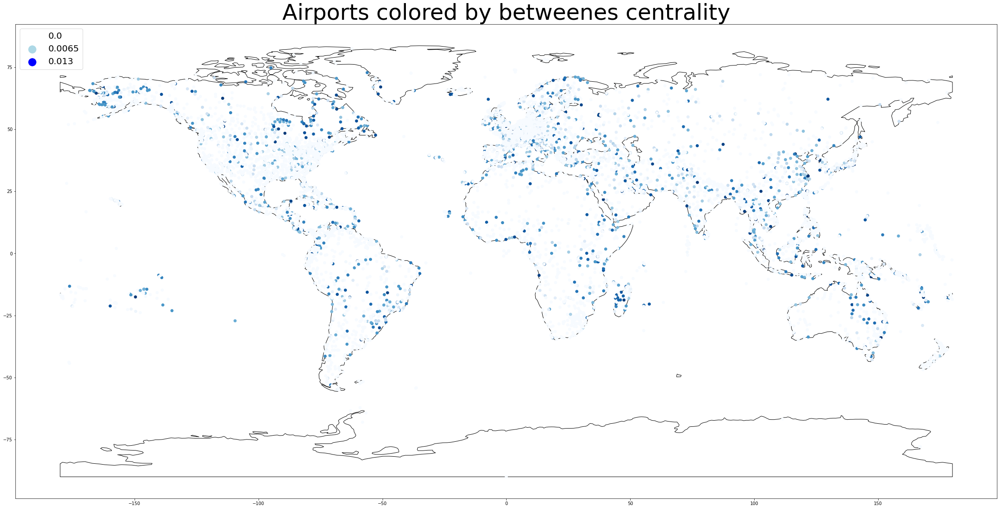

In [ ]:
ax = world.plot(color="white", edgecolor="black", figsize = (40,100))
gdf.plot(ax=ax, column = 'betweeness_centrality', legend = False, categorical=True, cmap = 'Blues')
ax.set_title('Airports colored by betweenes centrality', fontsize = 50)

custom_legend = [
    ('0.0', 'white'),
    ('0.0065', 'lightblue'),
    ('0.013', 'blue')
]

for label, color in custom_legend:
    ax.scatter([], [], color=color, label=label, s = 300)
legend = ax.legend(loc = 'upper left', fontsize=20)

plt.show()

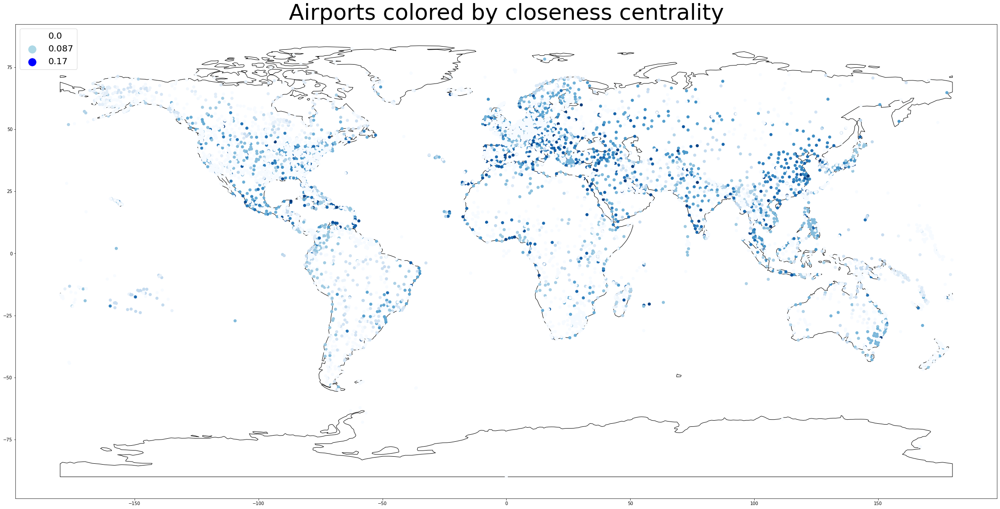

In [ ]:
ax = world.plot(color="white", edgecolor="black", figsize = (40,100))
gdf.plot(ax=ax, column = 'closeness_centrality', legend = False, categorical=True, cmap = 'Blues')
ax.set_title('Airports colored by closeness centrality', fontsize = 50)

custom_legend = [
    ('0.0', 'white'),
    ('0.087', 'lightblue'),
    ('0.17', 'blue')
]

for label, color in custom_legend:
    ax.scatter([], [], color=color, label=label, s = 300)
legend = ax.legend(loc = 'upper left', fontsize=20)

plt.show()

**Zhlukový koeficient a modularita siete**

Zabezpečenie priameho letu tam aj naspäť
-trojuholníky, dvojuholníky

In [56]:
def clustering(G,gdf):
  local_clustering_coefs = nx.clustering(G)
  gdf['local_clustering_coef'] = dict(sorted(local_clustering_coefs.items())).values()
  #gdf.sort_values(by = 'local_clustering_coef', ascending = False)[['Name','Country','local_clustering_coef']][0:10]
  avg_clustrering = np.mean(list(local_clustering_coefs.values()))
  return avg_clustrering

avg_clustering = clustering(G,gdf)
print(avg_clustering)

0.19416011385029147


In [31]:
def trans_reci(G):
  transitivity = nx.transitivity(G)
  reciprocity = nx.reciprocity(G)
  return transitivity, reciprocity

transitivity, reciprocity = trans_reci(G)
print(transitivity)
print(reciprocity)

0.25365017708214327
0.9720337038129897


# Silno suvisle komponenty

In [ ]:
scc = sorted(list(nx.strongly_connected_components(G)), key=len)

print("Strongly Connected Components:", len(scc))
print("Maximum size of component: ", max([len(x) for x in scc]))

Strongly Connected Components: 3743
Maximum size of component:  2868


In [ ]:
sizes_of_sccs = [len(x) for x in scc]
sizes_of_sccs.sort()

print("The number of one vertex components is:", sizes_of_sccs.count(1))
print(f"The largest component includes {max(sizes_of_sccs) / sum(sizes_of_sccs) * 100:0.2f}% of vertices")

The number of one vertex components is: 3734
The largest component includes 43.26% of vertices


In [ ]:
node_to_scc = {}
for i, component in enumerate(scc, 1):
    for node in component:
        node_to_scc[node] = i

# Add SCC ID column to DataFrame
gdf['SCC_ID'] = gdf['Airport ID'].map(node_to_scc)
gdf.loc[gdf['SCC_ID'] == 3742]

,Airport ID,Name,City,Country,IATA/FAA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,geometry,in_degree,out_degree,degree,betweeness_centrality,closeness_centrality,local_clustering_coef,SCC_ID
1957,1998,Kone,Kone,New Caledonia,KNQ,NWWD,-21.053428,164.837806,23,11.0,U,POINT (164.83781 -21.05343),1,1,2,0.000000e+00,0.000603,0.000000,3742
1959,2000,Lifou,Lifou,New Caledonia,LIF,NWWL,-20.774800,167.239864,92,11.0,U,POINT (167.23986 -20.77480),2,2,4,0.000000e+00,0.000644,1.000000,3742
1960,2001,Magenta,Noumea,New Caledonia,GEA,NWWM,-22.258278,166.472806,10,11.0,U,POINT (166.47281 -22.25828),7,6,13,9.103942e-07,0.001073,0.055556,3742
1961,2002,Mare,Mare,New Caledonia,MEE,NWWR,-21.481678,168.037508,141,11.0,U,POINT (168.03751 -21.48168),1,1,2,0.000000e+00,0.000603,0.000000,3742
1963,2004,Ouvea,Ouvea,New Caledonia,UVE,NWWV,-20.640556,166.572778,23,11.0,U,POINT (166.57278 -20.64056),1,1,2,0.000000e+00,0.000603,0.000000,3742
4403,5919,Tiga Airport,Tiga,New Caledonia,TGJ,NWWA,-21.096100,167.804000,128,11.0,U,POINT (167.80400 -21.09610),2,2,4,0.000000e+00,0.000644,1.000000,3742
4401,5921,Île des Pins Airport,NaN,New Caledonia,ILP,NWWE,-22.588900,167.456000,315,11.0,U,POINT (167.45600 -22.58890),1,1,2,0.000000e+00,0.000603,0.000000,3742


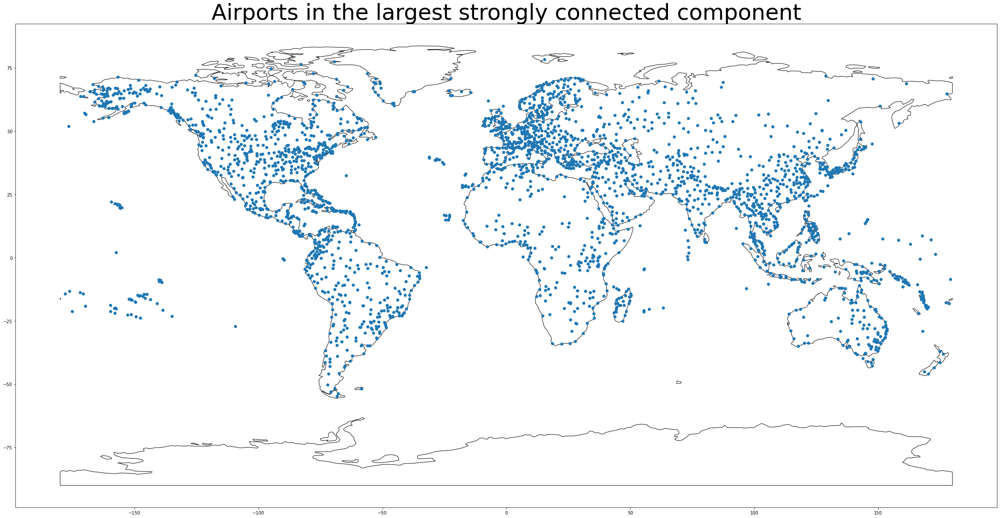

In [ ]:
# The largest component
ax = world.plot(color="white", edgecolor="black", figsize = (40,100))
gdf.loc[gdf["SCC_ID"] == 3743].plot(ax=ax)
ax.set_title('Airports in the largest strongly connected component', fontsize = 50)

plt.show()

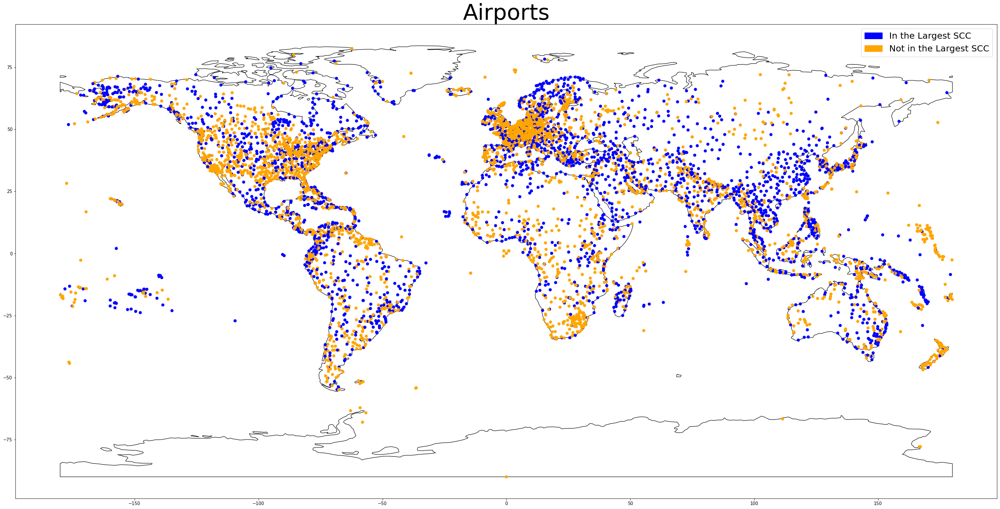

In [ ]:
import matplotlib.patches as mpatches
# Create a new column to store the colors
gdf['color'] = 'orange'  # Initialize all vertices to be orange
gdf.loc[gdf['SCC_ID'] == 3743, 'color'] = 'blue'  # Set vertices with SCC_ID 3743 to blue

# Plot the graph
ax = world.plot(color="white", edgecolor="black", figsize=(40, 100))
gdf.plot(ax=ax, color=gdf['color'])
ax.set_title('Airports', fontsize=50)

legend_handles = [mpatches.Patch(color='blue', label='In the Largest SCC'),
                  mpatches.Patch(color='orange', label='Not in the Largest SCC')]
ax.legend(handles=legend_handles, fontsize=20)

# Show the plot
plt.show()

# Nahodne siete a porovnanie s original sietou

**ER model**

In [69]:
def completely_random(vertices, p):
  G = nx.Graph()


  G.add_nodes_from(vertices)

  for i in range(len(vertices)):
    for j in range(i+1, len(vertices)):
      if np.random.rand() < p:
        G.add_edge(vertices[i], vertices[j])

  return G

G_ER = completely_random(df['Airport ID'], 0.0015)

In [70]:
edges_ER = pd.DataFrame(list(G_ER.edges()), columns=["source", "target"])

<ipython-input-7-5d85ad3a9a31>:8: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  gdf_edges['geometry'] = gdf_edges.apply(lambda row: LineString([(gdf.loc[row['source'], 'geometry'].x, gdf.loc[row['source'], 'geometry'].y),


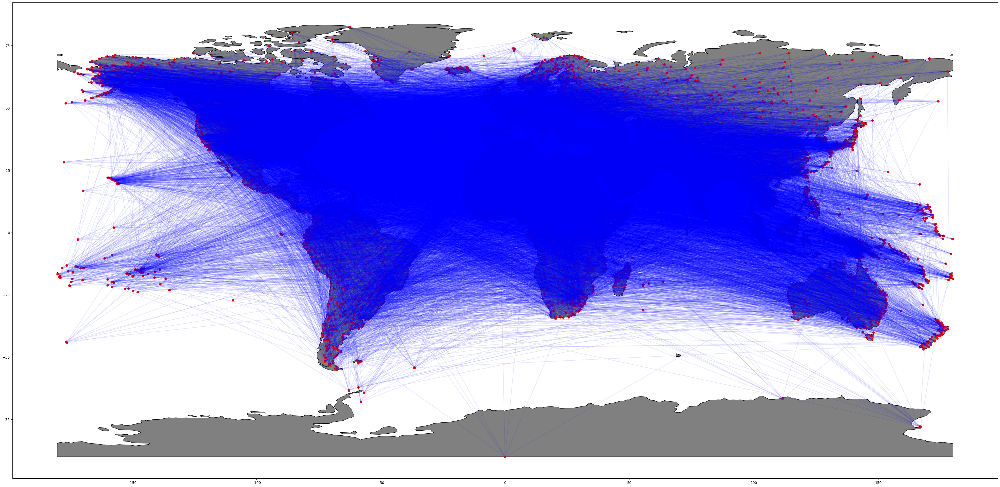

In [71]:
gdf_ER = create_map(edges_ER)

In [72]:
G_ER = create_G(edges_ER)
gdf_ER = degrees(gdf_ER, G_ER)
gdf_ER = betweeness(G_ER, gdf_ER)
gdf_ER = closeness(G_ER, gdf_ER)
avg_clustrering_ER = clustering(G_ER, gdf_ER)
transitivity_ER, reciprocity_ER = trans_reci(G_ER)

In [73]:
gdf_ER[['Airport ID', 'City','degree','betweeness_centrality', 'closeness_centrality']].sort_values(by = 'closeness_centrality', ascending = False)

,Airport ID,City,degree,betweeness_centrality,closeness_centrality
6552,7979,Tucson,10,0.0,0.098673
6580,8007,Itzehoe,13,0.0,0.094950
6301,7727,Monument Valley,11,0.0,0.093889
6620,8047,Camarillo,12,0.0,0.092344
6573,8000,Kiev,12,0.0,0.090896
...,...,...,...,...,...
582,587,Gilze-rijen,8,0.0,0.000000
581,586,Groningen,9,0.0,0.000000
578,583,Deelen,4,0.0,0.000000
576,581,Weert,12,0.0,0.000000


**configuration model**

In [61]:
original_vertex_ids = df['Airport ID']

id_mapping = {node_id: i for i, node_id in enumerate(original_vertex_ids)}

degree_sequence = list(gdf['degree'])

nodes_with_ids = []

for i, node_id in enumerate(original_vertex_ids):
  nodes_with_ids.append(id_mapping[node_id])


G_conf = nx.configuration_model(degree_sequence)

node_id_map_back = {v: k for k, v in id_mapping.items()}
G_conf = nx.relabel_nodes(G_conf, node_id_map_back)

In [62]:
edges_conf = pd.DataFrame(list(G_conf.edges()), columns=["source", "target"])

<ipython-input-7-5d85ad3a9a31>:8: FutureWarning: You are adding a column named 'geometry' to a GeoDataFrame constructed without an active geometry column. Currently, this automatically sets the active geometry column to 'geometry' but in the future that will no longer happen. Instead, either provide geometry to the GeoDataFrame constructor (GeoDataFrame(... geometry=GeoSeries()) or use `set_geometry('geometry')` to explicitly set the active geometry column.
  gdf_edges['geometry'] = gdf_edges.apply(lambda row: LineString([(gdf.loc[row['source'], 'geometry'].x, gdf.loc[row['source'], 'geometry'].y),


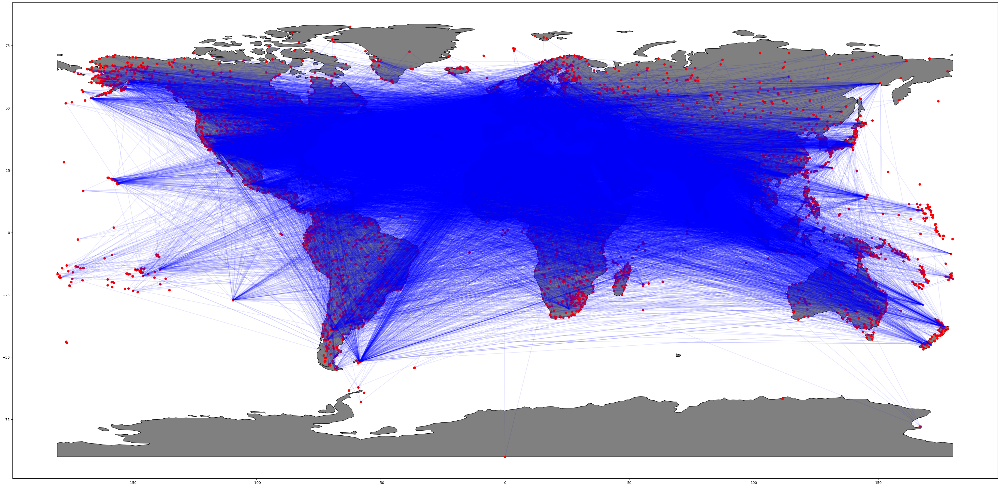

In [63]:
gdf_conf = create_map(edges_conf)

In [78]:
G_conf = create_G(edges_conf)
gdf_conf = degrees(gdf_conf, G_conf)
gdf_conf = betweeness(G_conf, gdf_conf)
gdf_conf = closeness(G_conf, gdf_conf)
avg_clustrering_conf = clustering(G_conf, gdf_conf)
transitivity_conf, reciprocity_conf = trans_reci(G_conf)

In [79]:
def print_statistics(gdfs, description, index,args = None):
  if(args is not None):
    print(f'Original network {description}: {args[0]}')
    print(f'ER model network {description}:  {args[1]}')
    print(f'Conf model network {description}: {args[2]}')
    return

  gdf, gdf_ER, gdf_conf = gdfs
  print(f'Original network {description}: {np.mean(gdf[index])}')
  print(f'ER model network {description}:  {np.mean(gdf_ER[index])}')
  print(f'Conf model network {description}: {np.mean(gdf_conf[index])}')

In [76]:
print_statistics((gdf,gdf_ER,gdf_conf),'average degree','degree')

Original network average degree: 9.200904977375565
ER model network average degree:  9.961689291101056
Conf model network average degree: 8.452488687782806


In [80]:
print_statistics((gdf,gdf_ER,gdf_conf),'betweeness','betweeness_centrality')

Original network betweeness: 8.992527675302325e-05
ER model network betweeness:  4.451468805177487e-05
Conf model network betweeness: 1.5049323854231688e-05


In [81]:
print_statistics((gdf,gdf_ER,gdf_conf),'closeness','closeness_centrality')

Original network closeness: 0.0471290053366754
ER model network closeness:  0.01170674130324401
Conf model network closeness: 0.015274833446994061


In [82]:
print_statistics((gdf,gdf_ER,gdf_conf),'average clustering',None,[avg_clustering,avg_clustrering_ER, avg_clustrering_conf])

Original network average clustering: 0.19416011385029147
ER model network average clustering:  0.0007707746705827481
Conf model network average clustering: 0.03192441197967785


In [83]:
print_statistics((gdf,gdf_ER,gdf_conf),'transitivity',None,[transitivity,transitivity_ER, transitivity_conf])

Original network transitivity: 0.25365017708214327
ER model network transitivity:  0.0007681818181818181
Conf model network transitivity: 0.05096137234163587


In [84]:
print_statistics((gdf,gdf_ER,gdf_conf),'reciprocity',None,[reciprocity,reciprocity_ER, reciprocity_conf])

Original network reciprocity: 0.9720337038129897
ER model network reciprocity:  0.0
Conf model network reciprocity: 0.0
